## Conditional Generation with Variational Autoencoders and
## Generative Adversarial Networks

Dataset: Kuzushiji-49 Dataset

Model Descriptions
In this project we have implemented C-VAE and C-GAN, used Kuzushiji-49 dataset to
generate Japanese characters. Dataset contains training and testing images with labels. We 
computed binary style labels based on the median, those with more than the median number 
of foreground pixels (value greater than 128) labelled as thick, otherwise thin. Also, in 
C_GAN model each image converted to grayscale, and resizing them to 64x64 pixels, and 
normalizing the pixel values to the range [-1, 1]. Resizing process helps a consistent input 
size for all images, making them compatible with neural network architectures and reducing 
computational load, normalization improves convergence and gradient flow during training, 
associates input values with activation functions like tanh, and helps uniform input feature 
scaling. These preprocessing steps are essential for efficient and effective model training.
However, in C-Van model normalization did not helped at all so we used normalization only 
in C-GAN model.

In [4]:
# Essential libraries

import numpy as np
import pandas as pd
import os
import torch
from torch import nn
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [7]:
# download the data 

import requests
from tqdm.notebook import tqdm

def download_file(url, destination):
    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 Kibibyte

    t = tqdm(total=total_size, unit='iB', unit_scale=True)
    with open(destination, 'wb') as file:
        for data in response.iter_content(block_size):
            t.update(len(data))
            file.write(data)
    t.close()

    if total_size != 0 and t.n != total_size:
        print("ERROR, something went wrong")

# Define the URLs and destination paths
urls = {
    'train_images': 'http://codh.rois.ac.jp/kmnist/dataset/k49/k49-train-imgs.npz',
    'train_labels': 'http://codh.rois.ac.jp/kmnist/dataset/k49/k49-train-labels.npz',
    'test_images': 'http://codh.rois.ac.jp/kmnist/dataset/k49/k49-test-imgs.npz',
    'test_labels': 'http://codh.rois.ac.jp/kmnist/dataset/k49/k49-test-labels.npz'
}

# Define the destination paths
destination_paths = {
    'train_images': 'k49-train-imgs.npz',
    'train_labels': 'k49-train-labels.npz',
    'test_images': 'k49-test-imgs.npz',
    'test_labels': 'k49-test-labels.npz'
}

# Download the files
for key in urls:
    print(f"Downloading {key}...")
    download_file(urls[key], destination_paths[key])
    print(f"{key} downloaded successfully.")


  0%|          | 0.00/66.1M [00:00<?, ?iB/s]

train_images downloaded successfully.


  0%|          | 0.00/164k [00:00<?, ?iB/s]

train_labels downloaded successfully.


  0%|          | 0.00/11.0M [00:00<?, ?iB/s]

test_images downloaded successfully.


  0%|          | 0.00/27.4k [00:00<?, ?iB/s]

test_labels downloaded successfully.


### Load the Dataset and Create 'Style' Labels

First, we'll load the dataset files using numpy. Create an additional ‘style’ label for each image, thick or thin, and store this label with the data. We will convert the images and labels to PyTorch tensors and create data loaders to simplify the process of iterating data during training and testing and ensure that images are in the correct format using transforms.

Then assign the style label to the image based on whether the number of foreground pixels greater than the median. If the number of foreground pixels greater than the median, the style label is 1 ('thick'); otherwise, it is 0 ('thin'). We converts the boolean value to an integer, true=1 and false=0.

In [5]:
train_images = np.load('k49-train-imgs.npz')['arr_0']
train_labels = np.load('k49-train-labels.npz')['arr_0']
test_images = np.load('k49-test-imgs.npz')['arr_0']
test_labels = np.load('k49-test-labels.npz')['arr_0']

print(train_images.shape)  
print(train_labels.shape) 
print(test_images.shape) 
print(test_labels.shape)   

(232365, 28, 28)
(232365,)
(38547, 28, 28)
(38547,)


### Data preprocessing for C-VAE model

In [7]:
# function to compute style labels

def compute_style_labels(images, labels):
    num_classes = len(np.unique(labels))
    style_labels = np.zeros_like(labels)
    
    for cls in range(num_classes):
        class_images = images[labels == cls]
        num_foreground_pixels = np.array([np.sum(img > 128) for img in class_images])
        median_value = np.median(num_foreground_pixels)
        
        for i, img in enumerate(class_images):
            style_labels[labels == cls][i] = int(np.sum(img > 128) > median_value)
    
    return style_labels

# apply to training and test sets
train_style_labels = compute_style_labels(train_images, train_labels)
test_style_labels = compute_style_labels(test_images, test_labels)

# Verify the results
print(train_style_labels.shape)  
print(test_style_labels.shape) 

# images are converted to PyTorch tensors in the range [0.0, 1.0]
transform = transforms.Compose([
    transforms.ToTensor()
])

class KuzushijiDataset(Dataset):
    def __init__(self, images, labels, style_labels, transform=None):
        self.images = images
        self.labels = labels
        self.style_labels = style_labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        style_label = self.style_labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label, style_label

# Create datasets and dataloaders
train_dataset = KuzushijiDataset(train_images, train_labels, train_style_labels, transform)
test_dataset = KuzushijiDataset(test_images, test_labels, test_style_labels, transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# let's check the data loader
data_iter = iter(train_loader)
images, labels, style_labels = next(data_iter)
print(images.shape, labels.shape, style_labels.shape)

(232365,)
(38547,)
torch.Size([64, 1, 28, 28]) torch.Size([64]) torch.Size([64])


### Preprocessing for C-GAN model

In [8]:
# preprocessing for C-Gan model, one hot encoding used in the preprocessing step. Also used normalization.

# set the device
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# custom dataset class for Kuzushiji-49
class KuzushijiDataset(Dataset):
    def __init__(self, images, labels, style_labels, transform=None):
        self.images = images
        self.labels = labels
        self.style_labels = style_labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        style_label = self.style_labels[idx]
        
        # convert numpy array to PIL Image
        image = Image.fromarray(image)
        
        if self.transform:
            image = self.transform(image)
            
        
        # one hot encodeing to represent binary vectors
        label_onehot = torch.eye(49)[label]
        return image, label_onehot, style_label
    
# create additional style label 

def compute_style_labels(images, labels):
    num_classes = len(np.unique(labels)) #number of unique class labels
    style_labels = np.zeros_like(labels) #initializing labels to store the style labels
    
    for cls in range(num_classes):
        class_images = images[labels == cls]
        
        # set the treshhold for median to label the style
        num_foreground_pixels = np.array([np.sum(img > 128) for img in class_images])
        median_value = np.median(num_foreground_pixels)
        
        for i, img in enumerate(class_images):
            style_labels[labels == cls][i] = int(np.sum(img > 128) > median_value)
            
    return style_labels

# initialize and prepare the datasets and dataloaders
train_style_labels = compute_style_labels(train_images, train_labels)
test_style_labels = compute_style_labels(test_images, test_labels)

# define a transform to convert the images to grayscale and resize to 64x64
mytransform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),  # normalize to range [-1,1]
])

train_dataset = KuzushijiDataset(train_images, train_labels, train_style_labels, mytransform)
test_dataset = KuzushijiDataset(test_images, test_labels, test_style_labels, mytransform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# lets check the dataloader
data_iter = iter(train_loader)
images, labels, style_labels = next(data_iter)
print(images.shape, labels.shape, style_labels.shape)

torch.Size([32, 1, 64, 64]) torch.Size([32, 49]) torch.Size([32])


### Conditional Variational Autoencoder (C-VAE)

The Conditional Variational Autoencoder (C-VAE) is an extension of the Variational Autoencoder (VAE), designed to generate data conditioned on specific labels. The model consists of an encoder, a decoder, and a reparameterization step to learn a latent space representation of the input data conditioned on labels. In here I presented only try3, with regularization technique. 

Using learning rate: 0.001
Epoch 1/50, Training Loss: 236.1315679853759, Validation Loss: 210.1397982774073
Epoch 2/50, Training Loss: 196.22435885991598, Validation Loss: 199.83450723761334
Epoch 3/50, Training Loss: 189.22736450297754, Validation Loss: 195.86038210303735
Epoch 4/50, Training Loss: 185.5060262351594, Validation Loss: 193.23639464028898
Epoch 5/50, Training Loss: 182.85239900721925, Validation Loss: 191.0871145837387
Epoch 6/50, Training Loss: 181.05718181625622, Validation Loss: 189.71925356418583
Epoch 7/50, Training Loss: 179.78232826385752, Validation Loss: 188.28459002134366
Epoch 8/50, Training Loss: 178.83344489424638, Validation Loss: 187.83624821291622
Epoch 9/50, Training Loss: 178.02524705205172, Validation Loss: 187.37193392512307
Epoch 10/50, Training Loss: 177.34714311392838, Validation Loss: 186.6450949135552
Epoch 11/50, Training Loss: 176.7999440052053, Validation Loss: 186.1582676895454
Epoch 12/50, Training Loss: 176.34458566037335, Validation Loss: 

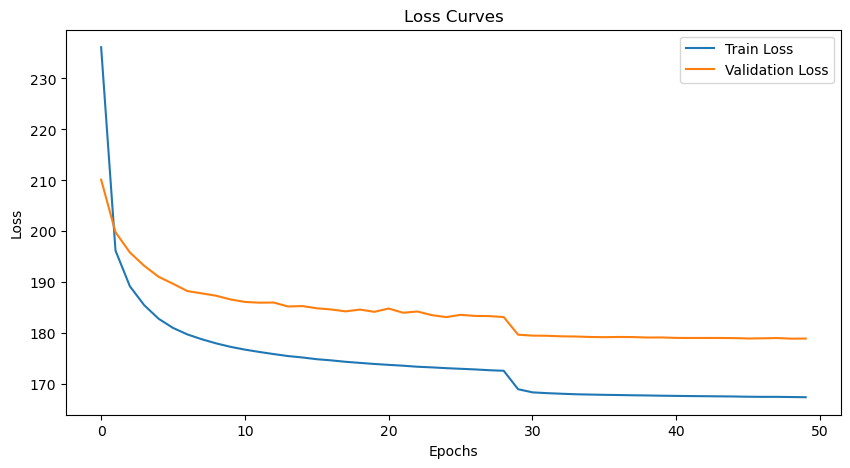

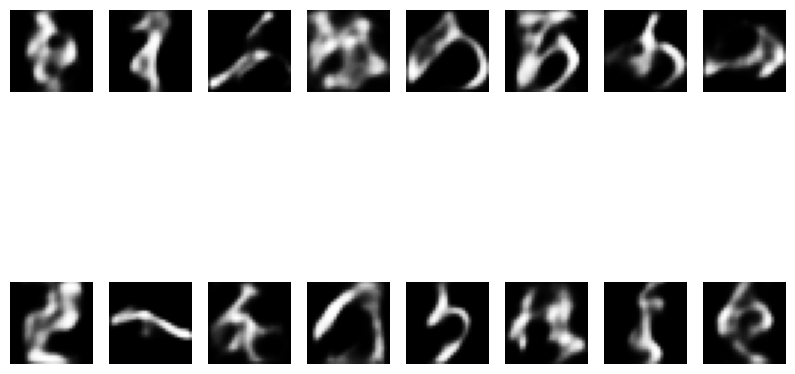

Generated samples saved to best_generated_samples_epoch_49.png


In [11]:
# since submitting time postponed desided to include C-VAE model implementation without generalization.

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

class CVAE(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, label_dim):
        super(CVAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim + label_dim + 1, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, latent_dim * 2)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + label_dim + 1, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
        )

    def encode(self, x, labels, style):
        inputs = torch.cat([x, labels, style], dim=1)
        h = self.encoder(inputs)
        mu, logvar = torch.chunk(h, 2, dim=1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, labels, style):
        inputs = torch.cat([z, labels, style], dim=1)
        return self.decoder(inputs)

    def forward(self, x, labels, style):
        mu, logvar = self.encode(x, labels, style)
        z = self.reparameterize(mu, logvar)
        return self.decode(z, labels, style), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE, KLD, BCE + KLD

def train_cvae(model, train_loader, test_loader, epochs, lr=1e-3, patience=10):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, verbose=True)
    print(f"Using learning rate: {lr}")
    
    train_loss_list = []
    test_loss_list = []
    
    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_epoch = 0

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        total_BCE = 0
        total_KLD = 0
        
        for data, labels, style in train_loader:
            data = data.view(data.size(0), -1).to(device)
            labels = labels.long().view(-1).to(device)
            labels_onehot = torch.eye(label_dim, device=device)[labels]
            style = style.unsqueeze(1).float().to(device)
            
            optimizer.zero_grad()
            recon_batch, mu, logvar = model(data, labels_onehot, style)
            BCE, KLD, loss = loss_function(recon_batch, data, mu, logvar)
            
            loss.backward()
            train_loss += loss.item()
            total_BCE += BCE.item()
            total_KLD += KLD.item()
            optimizer.step()
        
        avg_BCE = total_BCE / len(train_loader.dataset)
        avg_KLD = total_KLD / len(train_loader.dataset)
        avg_loss = train_loss / len(train_loader.dataset)
        train_loss_list.append(avg_loss)
        
        # Validation
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for data, labels, style in test_loader:
                data = data.view(data.size(0), -1).to(device)
                labels = labels.long().view(-1).to(device)
                labels_onehot = torch.eye(label_dim, device=device)[labels] # one hot encoding
                style = style.unsqueeze(1).float().to(device)
                
                recon_batch, mu, logvar = model(data, labels_onehot, style)
                _, _, loss = loss_function(recon_batch, data, mu, logvar)
                val_loss += loss.item()
        
        val_loss /= len(test_loader.dataset)
        test_loss_list.append(val_loss)
        scheduler.step(val_loss)
        
        print(f'Epoch {epoch+1}/{epochs}, Training Loss: {avg_loss}, Validation Loss: {val_loss}')
        
        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            best_epoch = epoch + 1
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience: # if model does not improve stop early
                print(f'Early stopping at epoch {epoch+1}')
                break
    
    plot_loss_curves(train_loss_list, test_loss_list)
    return best_epoch

def plot_loss_curves(train_loss_list, test_loss_list):
    plt.figure(figsize=(10, 5))
    plt.plot(train_loss_list, label='Train Loss')
    plt.plot(test_loss_list, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss Curves')
    plt.show()

def show_images(images, nrow=8, save_path=None):
    images = images.view(images.size(0), 28, 28).detach().cpu().numpy()
    plt.figure(figsize=(10, 10))
    for i in range(len(images)):
        plt.subplot(images.shape[0] // nrow + 1, nrow, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
    if save_path:
        plt.savefig(save_path)
    plt.show()

# Generate new samples
def generate_samples(model, num_samples, epoch, save_path=None):
    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim).to(device)
        labels = torch.eye(49, device=device)[torch.randint(0, 49, (num_samples,), device=device)]
        styles = torch.randint(0, 2, (num_samples, 1)).float().to(device)
        samples = model.decode(z, labels, styles)
        if save_path:
            save_path = f'{save_path}_epoch_{epoch}.png'
        show_images(samples, save_path=save_path)
        print(f'Generated samples saved to {save_path}')

# Set the dimensions
input_dim = 28 * 28  # 784
hidden_dim = 400
latent_dim = 30
label_dim = 49

# Initialize the model
cvae = CVAE(input_dim, hidden_dim, latent_dim, label_dim).to(device)

# Train the model with validation and early stopping
best_epoch = train_cvae(cvae, train_loader, test_loader, epochs=50, lr=0.001, patience=10)

# Load the best model
cvae.load_state_dict(torch.load('best_model.pth'))

# Generate and save samples for the epoch with the minimum loss
generate_samples(cvae, 16, best_epoch, save_path='best_generated_samples')


Using learning rate: 0.0001
Epoch 1/200, Training Loss: 313.00771212669855, Validation Loss: 284.79787177929705
Epoch 2/200, Training Loss: 276.6366266728463, Validation Loss: 256.6194332872046
Epoch 3/200, Training Loss: 255.31586287333505, Validation Loss: 243.08235283134468
Epoch 4/200, Training Loss: 243.94361342035967, Validation Loss: 233.74942725408673
Epoch 5/200, Training Loss: 237.30690293288575, Validation Loss: 228.8135296632601
Epoch 6/200, Training Loss: 233.29081693352188, Validation Loss: 225.71784955450084
Epoch 7/200, Training Loss: 230.494826696247, Validation Loss: 223.34716342123738
Epoch 8/200, Training Loss: 228.4131967797498, Validation Loss: 221.4828110736771
Epoch 9/200, Training Loss: 226.77190380116545, Validation Loss: 220.17442833332927
Epoch 10/200, Training Loss: 225.3784605358891, Validation Loss: 218.79222560536894
Epoch 11/200, Training Loss: 224.27662953321015, Validation Loss: 217.55401062998175
Epoch 12/200, Training Loss: 223.260315213269, Validat

Epoch 97/200, Training Loss: 210.01288185814883, Validation Loss: 203.81839783251615
Epoch 98/200, Training Loss: 210.0002759498795, Validation Loss: 203.80094032427135
Epoch 00099: reducing learning rate of group 0 to 1.0000e-07.
Epoch 99/200, Training Loss: 209.99092614932326, Validation Loss: 203.78219442589972
Epoch 100/200, Training Loss: 210.00400371082404, Validation Loss: 203.75415997333613
Epoch 101/200, Training Loss: 210.05306030769881, Validation Loss: 203.80198769622962
Epoch 102/200, Training Loss: 209.98590793814418, Validation Loss: 203.78747269465686
Epoch 103/200, Training Loss: 210.0707140268274, Validation Loss: 203.76534187617145
Epoch 00104: reducing learning rate of group 0 to 1.0000e-08.
Epoch 104/200, Training Loss: 210.02643736013385, Validation Loss: 203.74114959041478
Epoch 105/200, Training Loss: 210.06316868463946, Validation Loss: 203.8120405618871
Epoch 106/200, Training Loss: 210.04473361464588, Validation Loss: 203.80574818514978
Epoch 107/200, Trainin

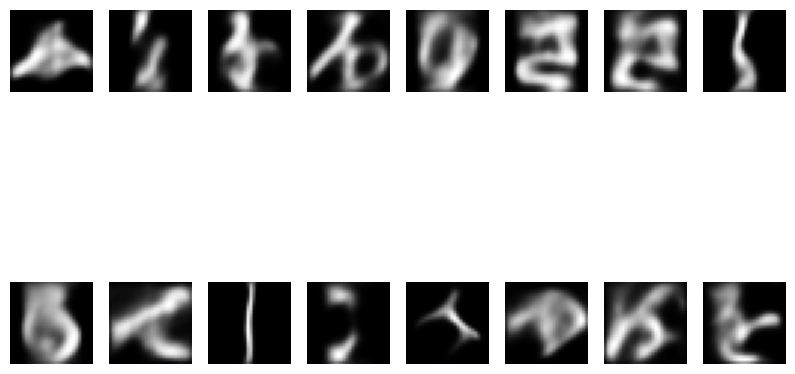

Generated samples saved to best_generated_samples_epoch_104.png


In [22]:
# CVAE with generalization

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class CVAE(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, label_dim):
        super(CVAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim + label_dim + 1, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3), #regularization.
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, latent_dim * 2)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + label_dim + 1, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
        )

    def encode(self, x, labels, style):
        inputs = torch.cat([x, labels, style], dim=1)
        h = self.encoder(inputs)
        mu, logvar = torch.chunk(h, 2, dim=1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, labels, style):
        inputs = torch.cat([z, labels, style], dim=1)
        return self.decoder(inputs)

    def forward(self, x, labels, style):
        mu, logvar = self.encode(x, labels, style)
        z = self.reparameterize(mu, logvar)
        return self.decode(z, labels, style), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE, KLD, BCE + KLD

def train_cvae(model, train_loader, test_loader, epochs, lr=1e-3, patience=10):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, verbose=True)
    print(f"Using learning rate: {lr}")
    
    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_epoch = 0

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        total_BCE = 0
        total_KLD = 0
        
        for data, labels, style in train_loader:
            data = data.view(data.size(0), -1)
            labels = labels.long().view(-1)
            labels_onehot = torch.eye(label_dim)[labels]
            style = style.unsqueeze(1).float()
            
            optimizer.zero_grad()
            recon_batch, mu, logvar = model(data, labels_onehot, style)
            BCE, KLD, loss = loss_function(recon_batch, data, mu, logvar)
            
            loss.backward()
            train_loss += loss.item()
            total_BCE += BCE.detach() # to save memory usage and computation time
            total_KLD += KLD.detach()
            optimizer.step()
        
        avg_BCE = total_BCE / len(train_loader.dataset)
        avg_KLD = total_KLD / len(train_loader.dataset)
        avg_loss = train_loss / len(train_loader.dataset)
        
        # Validation
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for data, labels, style in test_loader:
                data = data.view(data.size(0), -1)
                labels = labels.long().view(-1)
                labels_onehot = torch.eye(label_dim)[labels]
                style = style.unsqueeze(1).float()
                
                recon_batch, mu, logvar = model(data, labels_onehot, style)
                _, _, loss = loss_function(recon_batch, data, mu, logvar)
                val_loss += loss.item()
        
        val_loss /= len(test_loader.dataset)
        scheduler.step(val_loss)
        
        print(f'Epoch {epoch+1}/{epochs}, Training Loss: {avg_loss}, Validation Loss: {val_loss}')
        
        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            best_epoch = epoch + 1
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience: # checks if validation performance does not improve
                print(f'Early stopping at epoch {epoch+1}')
                break

    return best_epoch

def show_images(images, nrow=8, save_path=None):
    images = images.view(images.size(0), 28, 28).detach().cpu().numpy()
    plt.figure(figsize=(10, 10))
    for i in range(len(images)):
        plt.subplot(images.shape[0] // nrow + 1, nrow, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
    if save_path:
        plt.savefig(save_path)
    plt.show()

# Generate new samples
def generate_samples(model, num_samples, epoch, save_path=None):
    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim)
        labels = torch.eye(49)[torch.randint(0, 49, (num_samples,))]
        styles = torch.randint(0, 2, (num_samples, 1)).float()
        samples = model.decode(z, labels, styles)
        if save_path:
            save_path = f'{save_path}_epoch_{epoch}.png'
        show_images(samples, save_path=save_path)
        print(f'Generated samples saved to {save_path}')

# Set the dimensions
input_dim = 28 * 28  # 784
hidden_dim = 400
latent_dim = 20
label_dim = 49

# Initialize the model
cvae = CVAE(input_dim, hidden_dim, latent_dim, label_dim)

# Train the model with validation and early stopping
best_epoch = train_cvae(cvae, train_loader, test_loader, epochs=200, lr=0.0001, patience=10)

# Load the best model
cvae.load_state_dict(torch.load('best_model.pth'))

# Generate and save samples for the epoch with the minimum loss
generate_samples(cvae, 16, best_epoch, save_path='best_generated_samples')

# C-GAN

Define the Generator and Discriminator Models
The Generator will take a random noise vector concatenated with one-hot encoded class labels and style labels. The Discriminator will take real or fake images concatenated with the class labels and style labels.

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image

# Define the generator model
class Generator(nn.Module):
    def __init__(self, latent_dim, label_dim, style_dim, img_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim + label_dim + style_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, img_dim),
            nn.Tanh()
        )

    def forward(self, noise, labels, styles):  # let's add noise
        gen_input = torch.cat((noise, labels, styles), -1)
        img = self.model(gen_input)
        return img

# Define the discriminator model
class Discriminator(nn.Module):
    def __init__(self, img_dim, label_dim, style_dim):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(img_dim + label_dim + style_dim, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels, styles):
        disc_input = torch.cat((img, labels, styles), -1)
        validity = self.model(disc_input)
        return validity


In [12]:
# C-GAN model using C-VAE model's data preprocessing, unnormalized 

# The training loop will involve training the Generator and Discriminator. 
# We'll use Binary Cross-Entropy loss for both the Generator 
# and Discriminator.

device = 'cuda' if torch.cuda.is_available() else 'cpu'
# Define the training parameters
latent_dim = 100
label_dim = 49
style_dim = 1
img_dim = 28 * 28
epochs = 100

# Initialize models
generator = Generator(latent_dim, label_dim, style_dim, img_dim).to(device)
discriminator = Discriminator(img_dim, label_dim, style_dim).to(device)

# Loss function and optimizers
criterion = nn.BCELoss()
opt_gen = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
opt_disc = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Training loop
def train_cgan(generator, discriminator, dataloader, epochs):
    g_losses = []
    d_losses = []

    for epoch in range(epochs):
        for i, (imgs, labels, styles) in enumerate(dataloader):
            batch_size = imgs.size(0)
            valid = torch.ones(batch_size, 1).to(device)
            fake = torch.zeros(batch_size, 1).to(device)

            # Prepare real images, labels, and styles
            real_imgs = imgs.view(batch_size, -1).to(device)
            labels = labels.long().view(-1)
            labels_onehot = torch.eye(label_dim)[labels].to(device)
            styles = styles.unsqueeze(1).float().to(device)

            # Train Generator
            opt_gen.zero_grad()

            z = torch.randn(batch_size, latent_dim).to(device)
            gen_imgs = generator(z, labels_onehot, styles)
            g_loss = criterion(discriminator(gen_imgs, labels_onehot, styles), valid)
            g_loss.backward()
            opt_gen.step()

            # Train Discriminator
            opt_disc.zero_grad()

            real_loss = criterion(discriminator(real_imgs, labels_onehot, styles), valid)
            fake_loss = criterion(discriminator(gen_imgs.detach(), labels_onehot, styles), fake)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            opt_disc.step()

            # Save losses for plotting
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

        print(f"Epoch {epoch + 1}/{epochs} - Generator Loss: {g_loss.item():.4f}, Discriminator Loss: {d_loss.item():.4f}")

    return g_losses, d_losses

# Train the model

g_losses, d_losses = train_cgan(generator, discriminator, train_loader, epochs)


Epoch 1/100 - Generator Loss: 2.1394, Discriminator Loss: 0.2521
Epoch 2/100 - Generator Loss: 2.4810, Discriminator Loss: 0.1185
Epoch 3/100 - Generator Loss: 2.4936, Discriminator Loss: 0.1185
Epoch 4/100 - Generator Loss: 2.3614, Discriminator Loss: 0.1749
Epoch 5/100 - Generator Loss: 1.8668, Discriminator Loss: 0.3458
Epoch 6/100 - Generator Loss: 3.4382, Discriminator Loss: 0.2794
Epoch 7/100 - Generator Loss: 3.7773, Discriminator Loss: 0.0807
Epoch 8/100 - Generator Loss: 4.0601, Discriminator Loss: 0.1204
Epoch 9/100 - Generator Loss: 4.7713, Discriminator Loss: 0.1899
Epoch 10/100 - Generator Loss: 2.3914, Discriminator Loss: 0.1678
Epoch 11/100 - Generator Loss: 4.8347, Discriminator Loss: 0.1282
Epoch 12/100 - Generator Loss: 3.4664, Discriminator Loss: 0.1892
Epoch 13/100 - Generator Loss: 3.4635, Discriminator Loss: 0.1027
Epoch 14/100 - Generator Loss: 2.6421, Discriminator Loss: 0.0779
Epoch 15/100 - Generator Loss: 3.0553, Discriminator Loss: 0.0847
Epoch 16/100 - Gene

KeyboardInterrupt: 

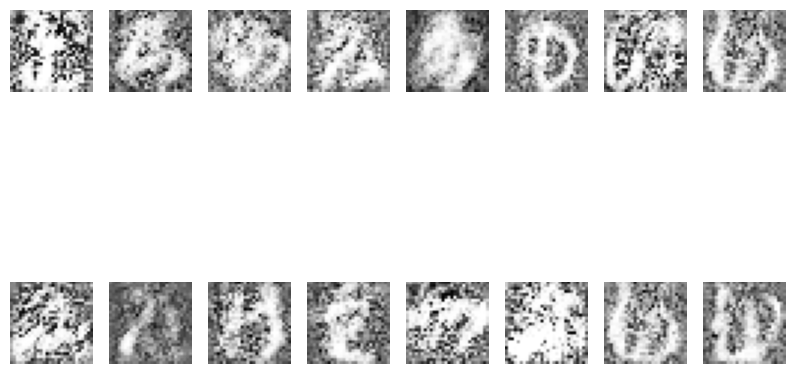

In [13]:
def generate_samples(generator, num_samples, save_path=None):
    generator.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim).to(device)
        labels = torch.eye(49)[torch.randint(0, 49, (num_samples,))].to(device)
        styles = torch.randint(0, 2, (num_samples, 1)).float().to(device)
        gen_imgs = generator(z, labels, styles).view(num_samples, 1, 28, 28)
        if save_path:
            save_image(gen_imgs, save_path, nrow=8, normalize=True)
        show_images(gen_imgs)

# Generate, show, and save samples
generate_samples(generator, 16, save_path='cgan_generated_64.png')


Epoch [0/150] Batch 0/7262                   Loss D: 0.6809, loss G: 0.6939


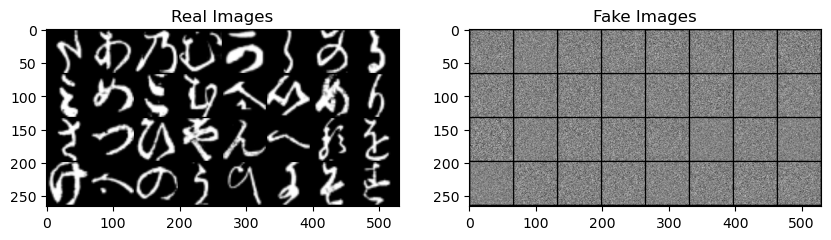

Epoch [1/150] Batch 0/7262                   Loss D: 0.2733, loss G: 2.4075


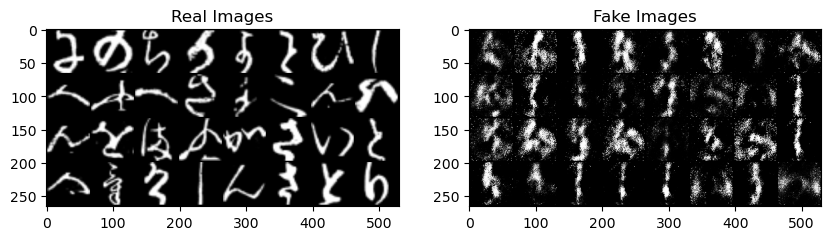

Epoch [2/150] Batch 0/7262                   Loss D: 0.3443, loss G: 1.9957


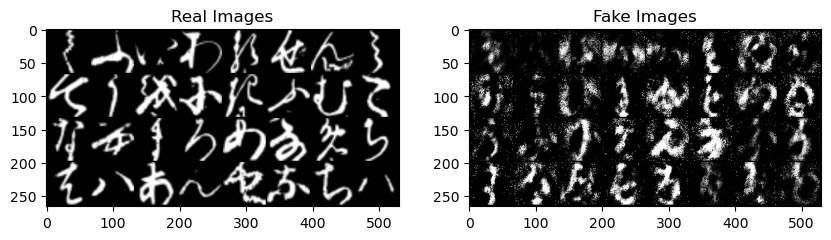

Epoch [3/150] Batch 0/7262                   Loss D: 0.5381, loss G: 1.5850


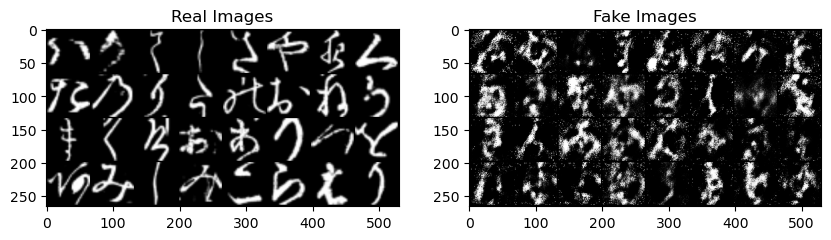

Epoch [4/150] Batch 0/7262                   Loss D: 0.3152, loss G: 2.1549


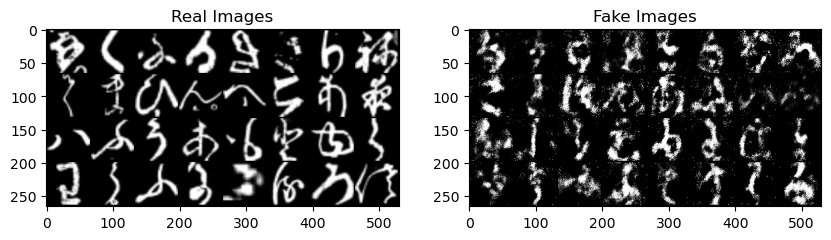

Epoch [5/150] Batch 0/7262                   Loss D: 0.3564, loss G: 2.1767


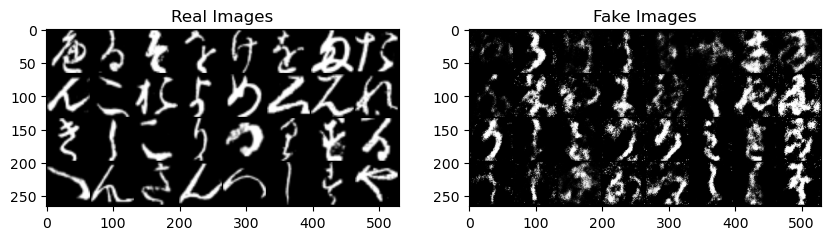

Epoch [6/150] Batch 0/7262                   Loss D: 0.3146, loss G: 2.1186


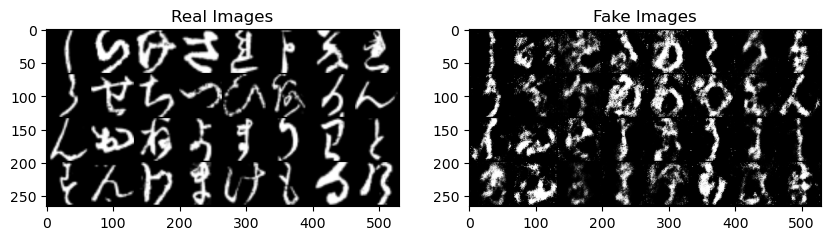

Epoch [7/150] Batch 0/7262                   Loss D: 0.3066, loss G: 2.0413


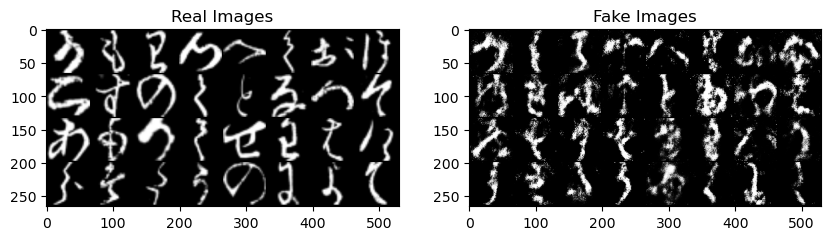

Epoch [8/150] Batch 0/7262                   Loss D: 0.4915, loss G: 1.8888


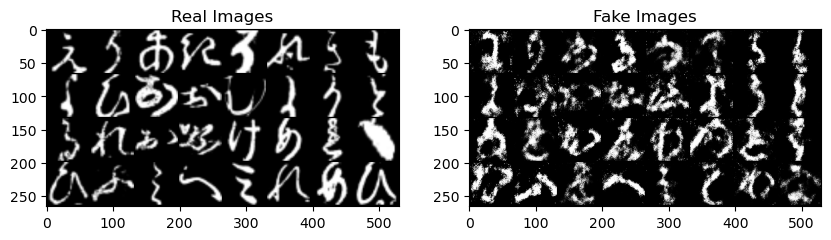

Epoch [9/150] Batch 0/7262                   Loss D: 0.3774, loss G: 2.0066


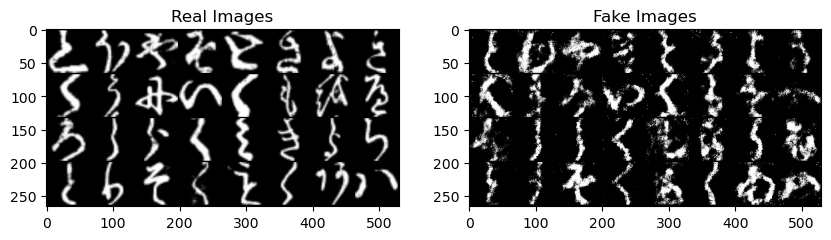

Epoch [10/150] Batch 0/7262                   Loss D: 0.4624, loss G: 1.8674


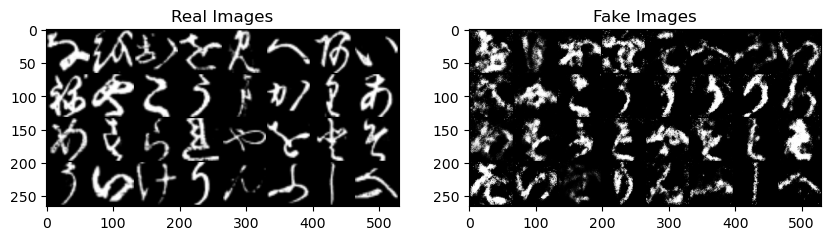

Epoch [11/150] Batch 0/7262                   Loss D: 0.4457, loss G: 1.9083


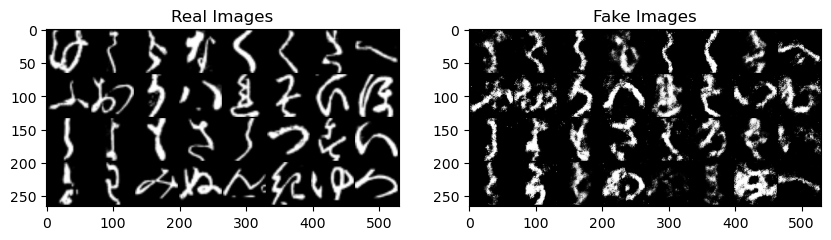

Epoch [12/150] Batch 0/7262                   Loss D: 0.4147, loss G: 1.7887


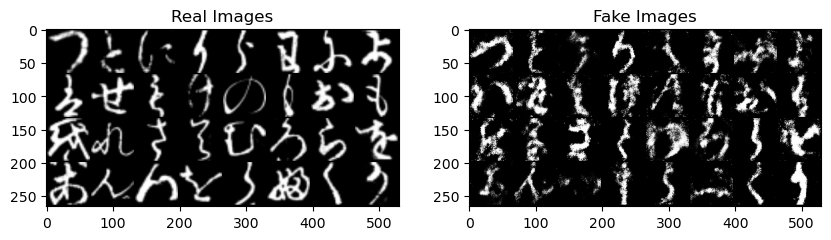

Epoch [13/150] Batch 0/7262                   Loss D: 0.6646, loss G: 1.2699


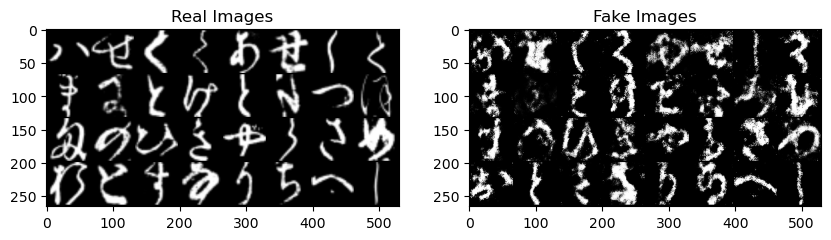

Epoch [14/150] Batch 0/7262                   Loss D: 0.4476, loss G: 1.9802


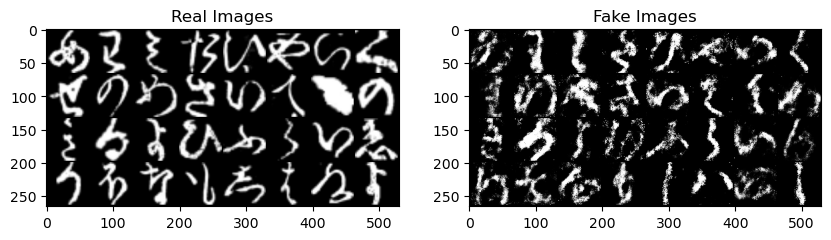

Epoch [15/150] Batch 0/7262                   Loss D: 0.5976, loss G: 1.2809


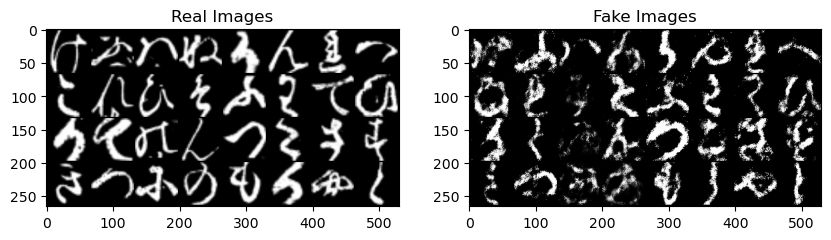

Epoch [16/150] Batch 0/7262                   Loss D: 0.4619, loss G: 1.5721


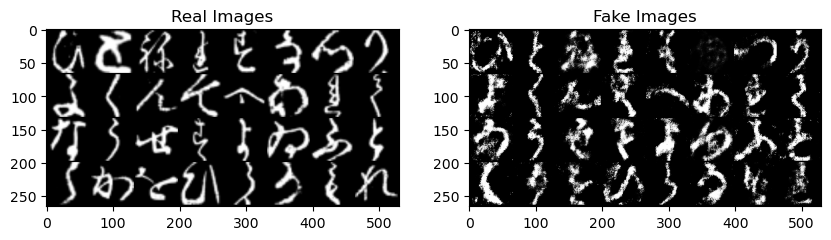

Epoch [17/150] Batch 0/7262                   Loss D: 0.4375, loss G: 1.7108


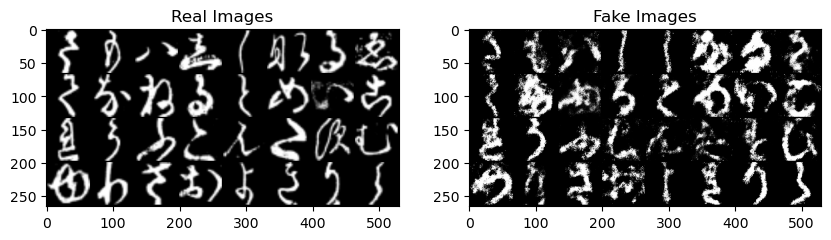

Epoch [18/150] Batch 0/7262                   Loss D: 0.5218, loss G: 1.6762


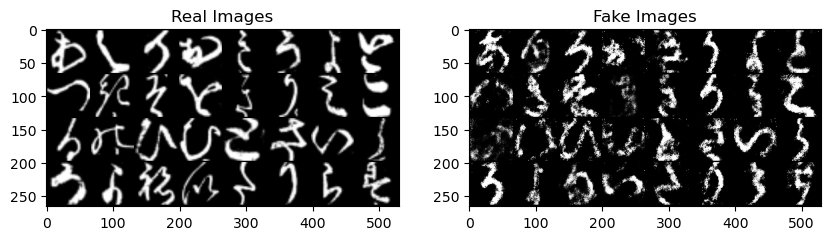

Epoch [19/150] Batch 0/7262                   Loss D: 0.4420, loss G: 1.7101


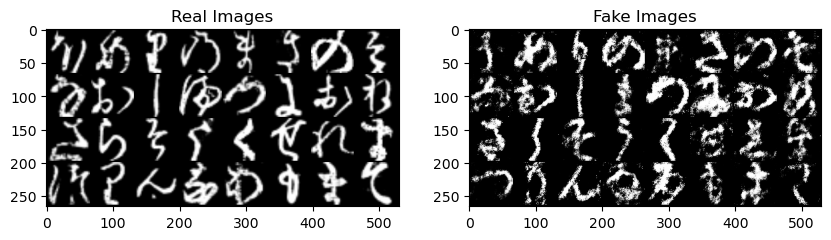

Epoch [20/150] Batch 0/7262                   Loss D: 0.3940, loss G: 1.9516


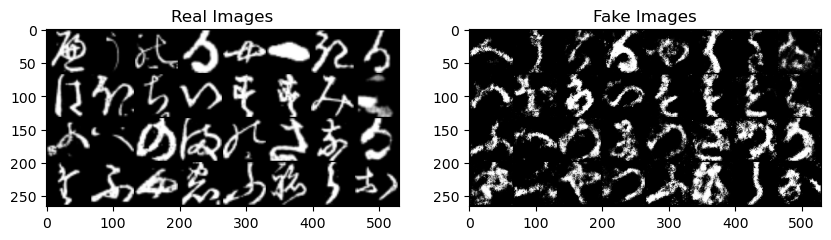

Epoch [21/150] Batch 0/7262                   Loss D: 0.6287, loss G: 1.4079


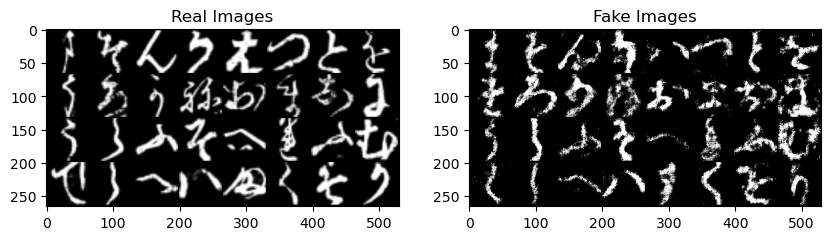

Epoch [22/150] Batch 0/7262                   Loss D: 0.5990, loss G: 1.7752


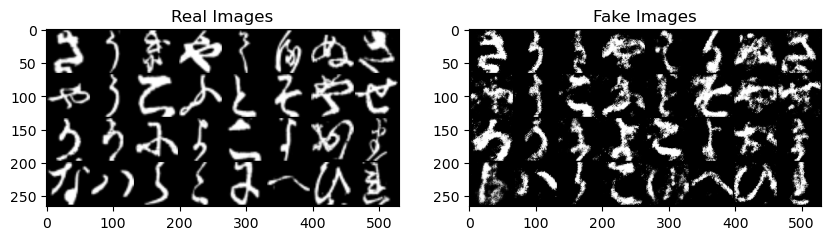

Epoch [23/150] Batch 0/7262                   Loss D: 0.4778, loss G: 1.4822


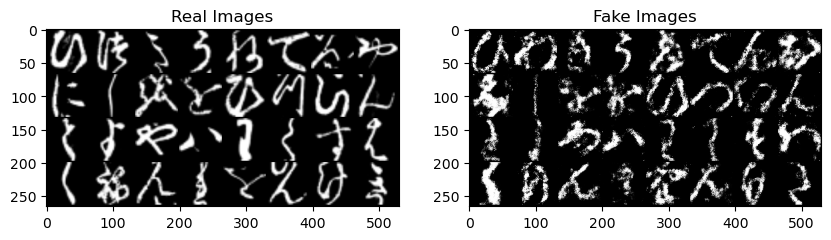

Epoch [24/150] Batch 0/7262                   Loss D: 0.4689, loss G: 1.5085


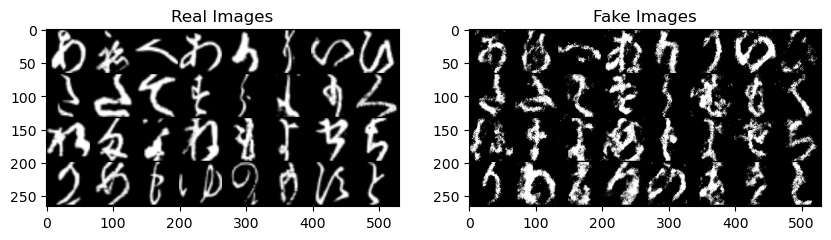

Epoch [25/150] Batch 0/7262                   Loss D: 0.5270, loss G: 1.5360


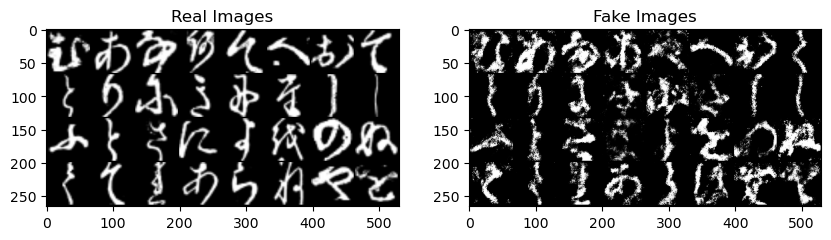

Epoch [26/150] Batch 0/7262                   Loss D: 0.5224, loss G: 1.6545


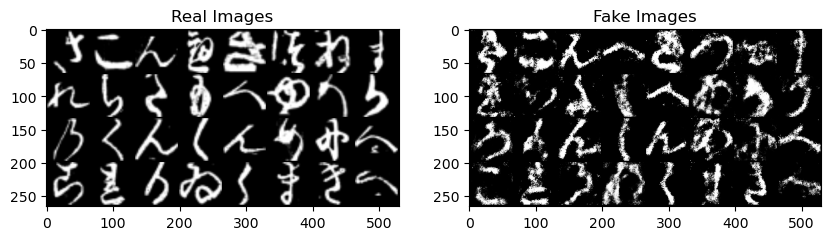

Epoch [27/150] Batch 0/7262                   Loss D: 0.4439, loss G: 1.6707


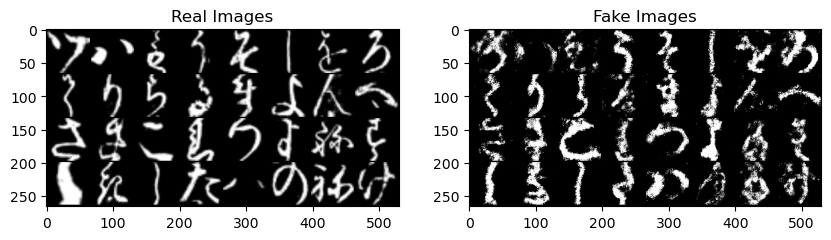

Epoch [28/150] Batch 0/7262                   Loss D: 0.4370, loss G: 1.6797


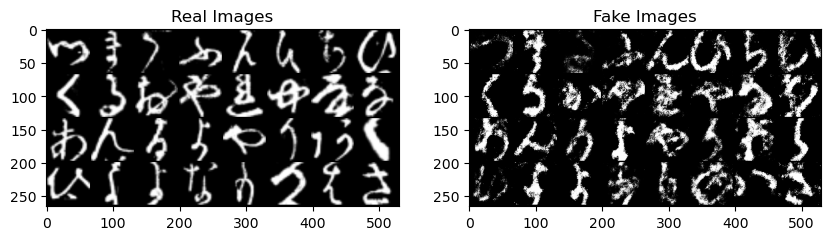

Epoch [29/150] Batch 0/7262                   Loss D: 0.5541, loss G: 1.3954


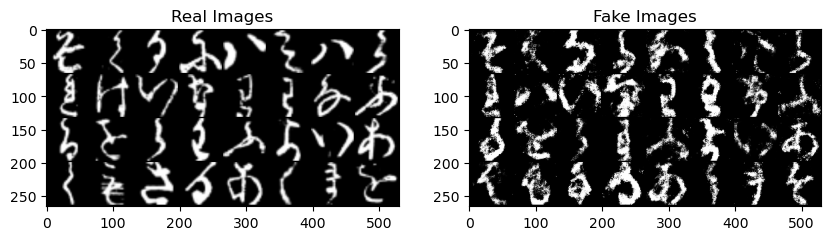

Epoch [30/150] Batch 0/7262                   Loss D: 0.5085, loss G: 1.5687


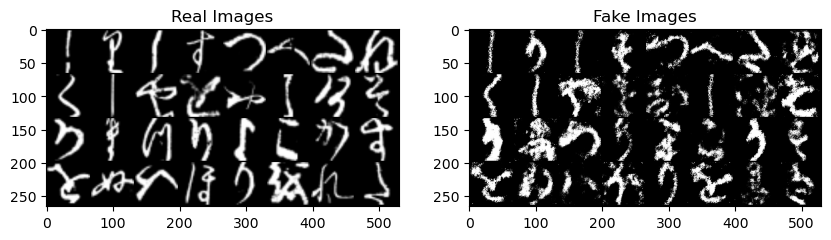

Epoch [31/150] Batch 0/7262                   Loss D: 0.4991, loss G: 1.6413


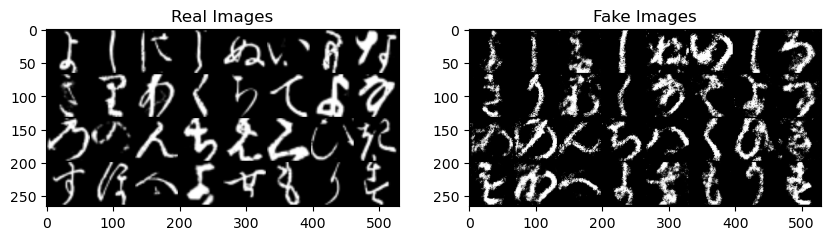

Epoch [32/150] Batch 0/7262                   Loss D: 0.4758, loss G: 1.3903


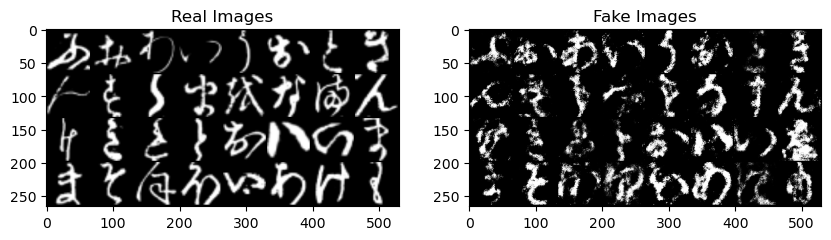

Epoch [33/150] Batch 0/7262                   Loss D: 0.5766, loss G: 1.6613


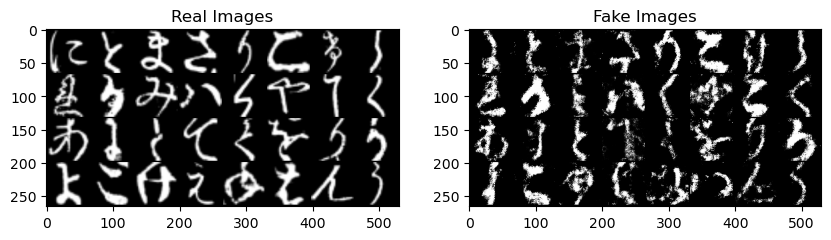

Epoch [34/150] Batch 0/7262                   Loss D: 0.5104, loss G: 1.8442


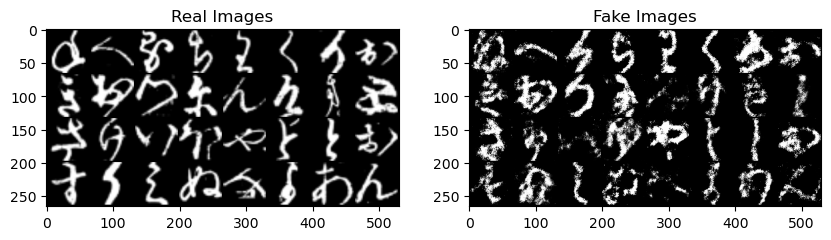

Epoch [35/150] Batch 0/7262                   Loss D: 0.4910, loss G: 1.5267


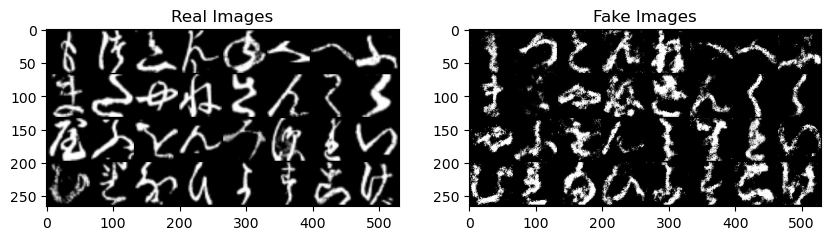

Epoch [36/150] Batch 0/7262                   Loss D: 0.5494, loss G: 1.5288


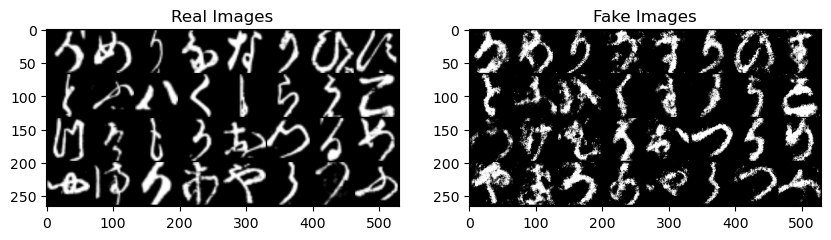

Epoch [37/150] Batch 0/7262                   Loss D: 0.4693, loss G: 1.5749


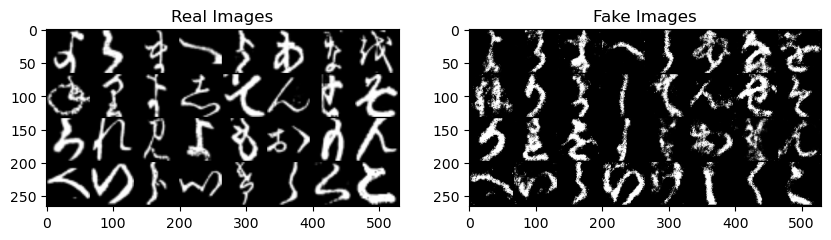

Epoch [38/150] Batch 0/7262                   Loss D: 0.5318, loss G: 1.5960


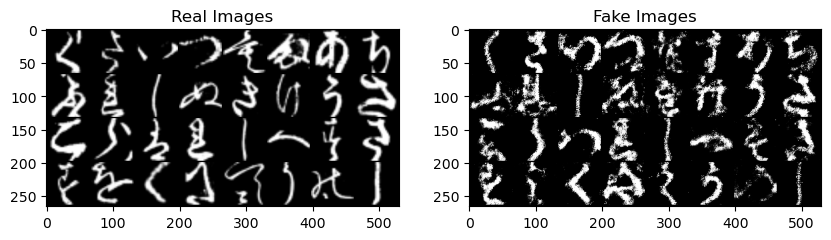

Epoch [39/150] Batch 0/7262                   Loss D: 0.4722, loss G: 1.5401


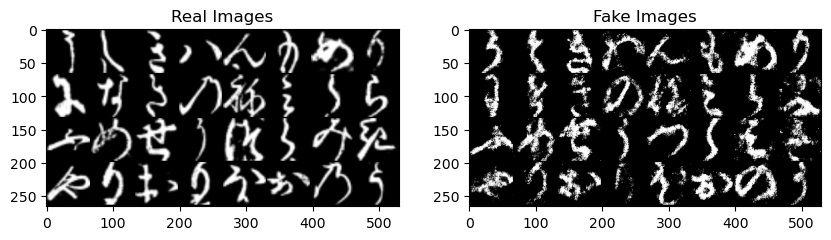

Epoch [40/150] Batch 0/7262                   Loss D: 0.5343, loss G: 1.5263


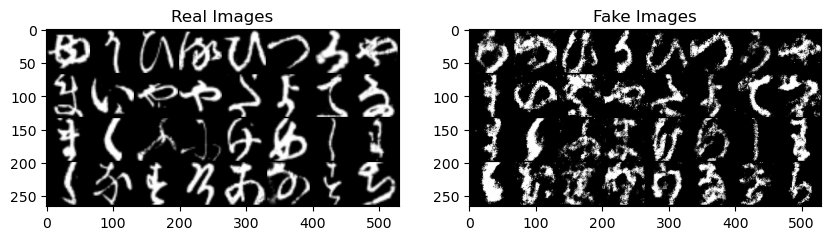

Epoch [41/150] Batch 0/7262                   Loss D: 0.5887, loss G: 1.4985


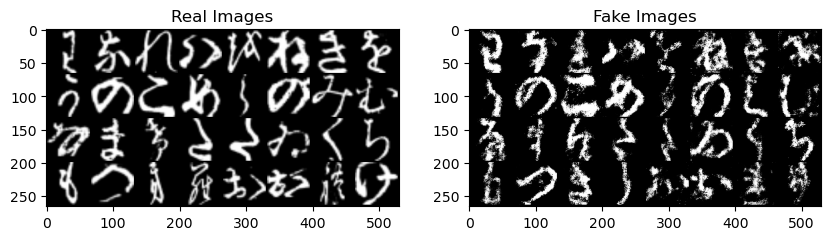

Epoch [42/150] Batch 0/7262                   Loss D: 0.6156, loss G: 1.2226


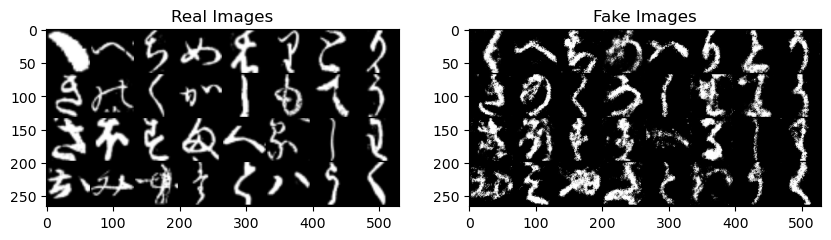

Epoch [43/150] Batch 0/7262                   Loss D: 0.5514, loss G: 1.2584


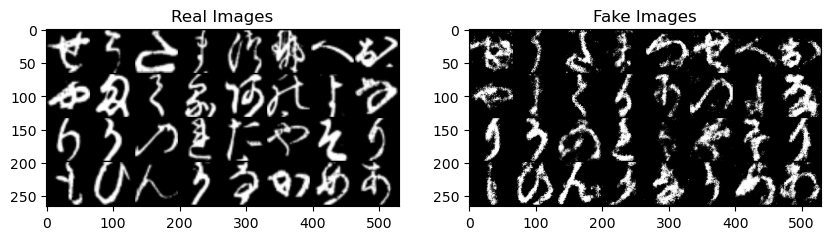

Epoch [44/150] Batch 0/7262                   Loss D: 0.4851, loss G: 1.3893


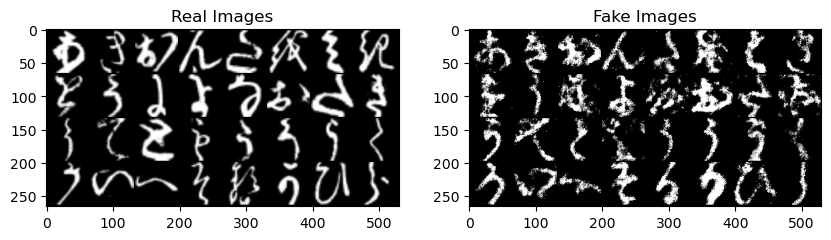

Epoch [45/150] Batch 0/7262                   Loss D: 0.5378, loss G: 1.5239


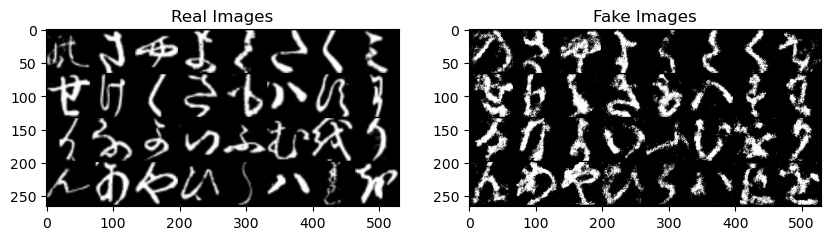

Epoch [46/150] Batch 0/7262                   Loss D: 0.4654, loss G: 1.4952


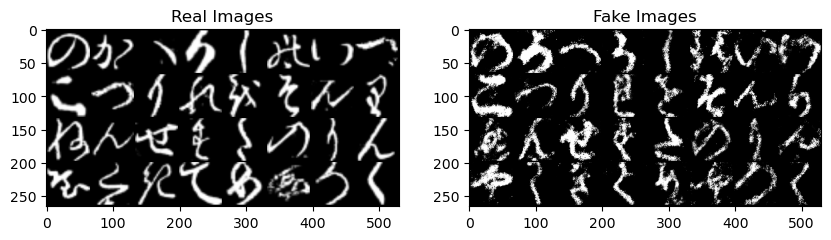

Epoch [47/150] Batch 0/7262                   Loss D: 0.5183, loss G: 1.5648


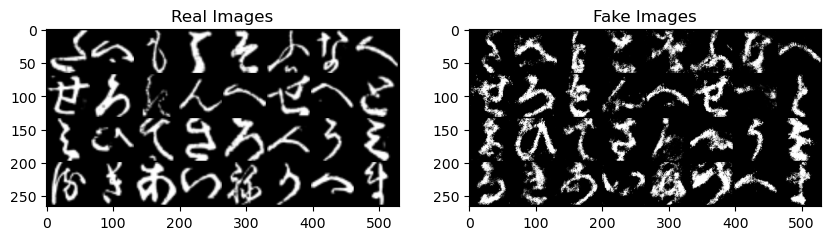

Epoch [48/150] Batch 0/7262                   Loss D: 0.5141, loss G: 1.6330


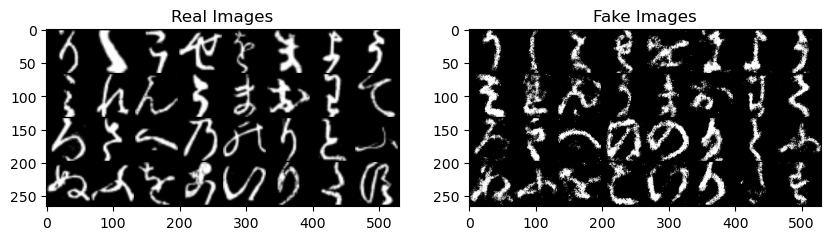

Epoch [49/150] Batch 0/7262                   Loss D: 0.4625, loss G: 1.7350


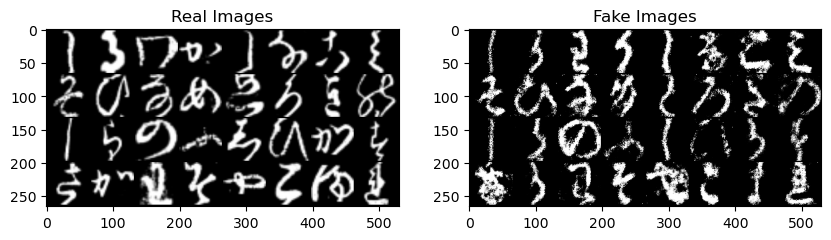

Epoch [50/150] Batch 0/7262                   Loss D: 0.4393, loss G: 1.5701


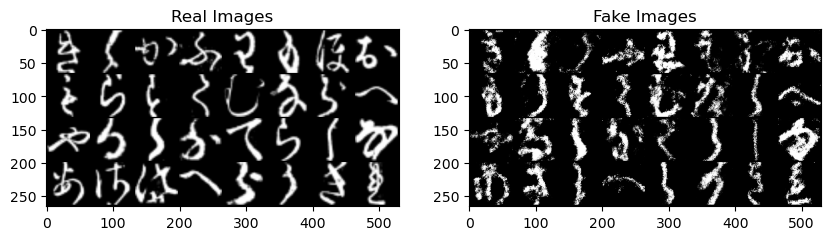

Epoch [51/150] Batch 0/7262                   Loss D: 0.4279, loss G: 1.5778


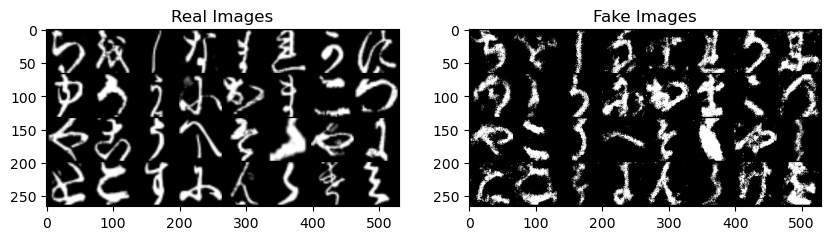

Epoch [52/150] Batch 0/7262                   Loss D: 0.5131, loss G: 1.5991


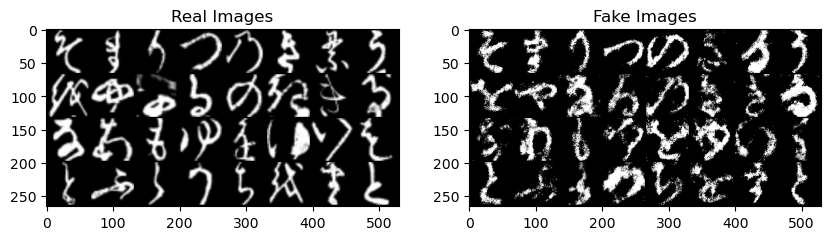

Epoch [53/150] Batch 0/7262                   Loss D: 0.4383, loss G: 1.7052


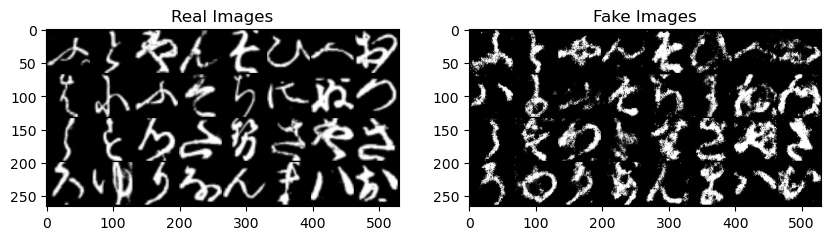

Epoch [54/150] Batch 0/7262                   Loss D: 0.4727, loss G: 1.4739


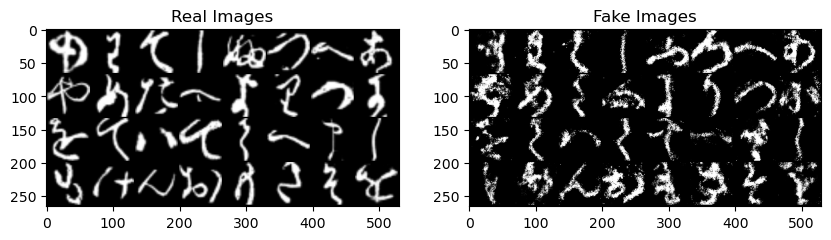

Epoch [55/150] Batch 0/7262                   Loss D: 0.4570, loss G: 1.5735


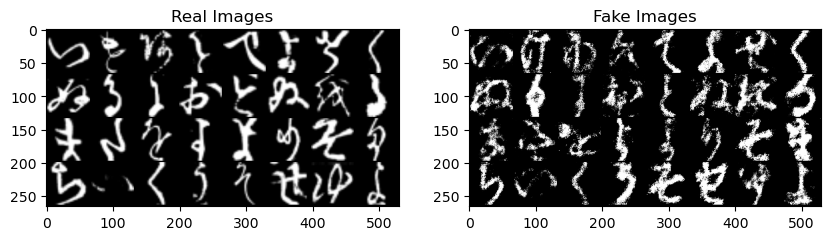

Epoch [56/150] Batch 0/7262                   Loss D: 0.5460, loss G: 1.4930


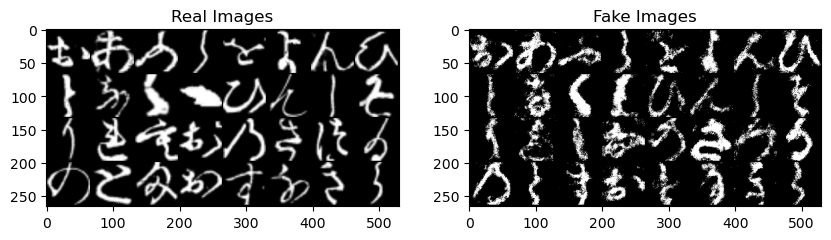

Epoch [57/150] Batch 0/7262                   Loss D: 0.5491, loss G: 1.4169


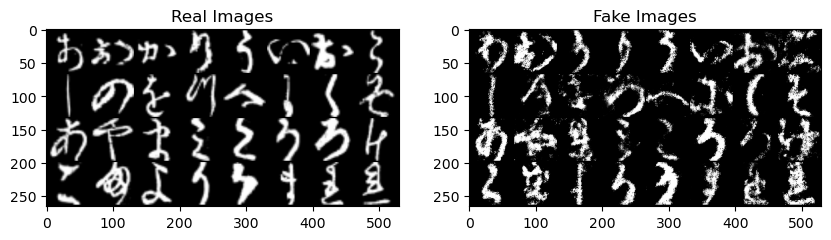

Epoch [58/150] Batch 0/7262                   Loss D: 0.5042, loss G: 1.6293


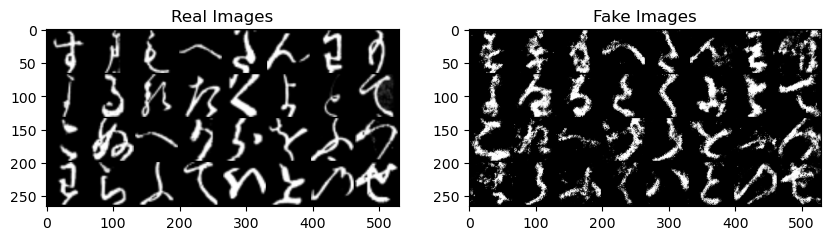

Epoch [59/150] Batch 0/7262                   Loss D: 0.5478, loss G: 1.4644


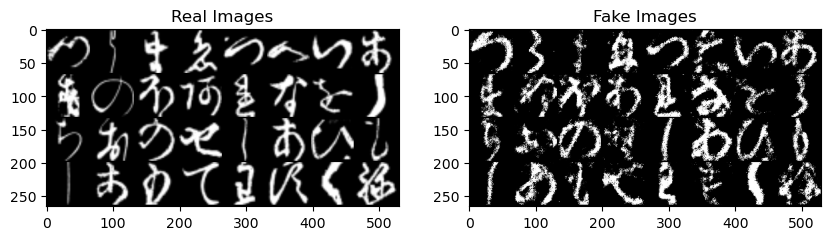

Epoch [60/150] Batch 0/7262                   Loss D: 0.5198, loss G: 1.4223


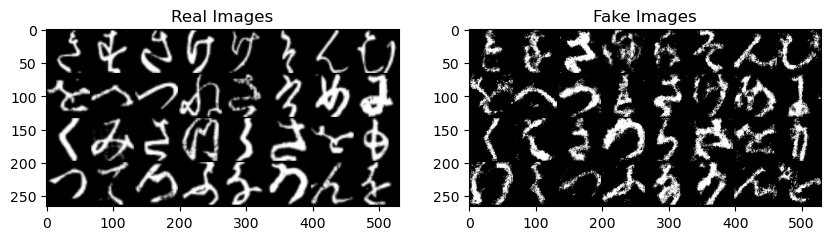

Epoch [61/150] Batch 0/7262                   Loss D: 0.5472, loss G: 1.3592


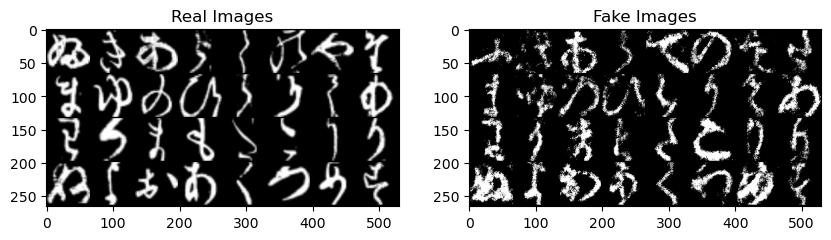

Epoch [62/150] Batch 0/7262                   Loss D: 0.6472, loss G: 1.1470


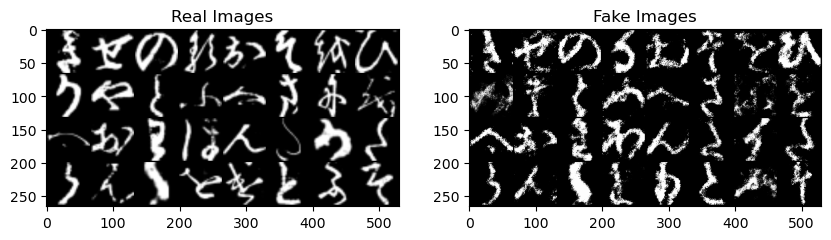

KeyboardInterrupt: 

In [16]:
# C-GAN model with normalization

class Generator(nn.Module):
    def __init__(self, latent_dim, label_dim, style_dim, img_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.Linear(latent_dim + label_dim + style_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, img_dim),
            nn.Tanh(),  # Because we normalize images to be between -1 and 1
        )

    def forward(self, noise, labels, styles):
        gen_input = torch.cat((noise, labels, styles), -1)
        return self.gen(gen_input)

class Discriminator(nn.Module):
    def __init__(self, img_dim, label_dim, style_dim):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(img_dim + label_dim + style_dim, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, img, labels, styles):
        disc_input = torch.cat((img, labels, styles), -1)
        return self.disc(disc_input)

# Hyperparameters etc.
latent_dim = 100
label_dim = 49  # number of classes
style_dim = 1  # dimension of style labels
img_x = img_y = 64
img_dim = img_x * img_y # the image size after initial transform
batch_size = 32
lr = 0.0002
epochs = 150

# Initialise generator and discriminator
generator = Generator(latent_dim, label_dim, style_dim, img_dim).to(device)
discriminator = Discriminator(img_dim, label_dim, style_dim).to(device)

# Optimisers
opt_gen = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_disc = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# Loss function
criterion = nn.BCELoss()

# Training loop
g_losses = []
d_losses = []

for epoch in range(epochs):
    for batch_idx, (real, labels, styles) in enumerate(train_loader):
        real = real.view(-1, img_dim).to(device)
        labels = labels.to(device)
        styles = styles.unsqueeze(1).float().to(device)
        batch_size = real.shape[0]

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        noise = torch.randn(batch_size, latent_dim).to(device)
        fake = generator(noise, labels, styles)

        disc_real = discriminator(real, labels, styles).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = discriminator(fake.detach(), labels, styles).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        discriminator.zero_grad()
        lossD.backward()
        opt_disc.step()

        # Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = discriminator(fake, labels, styles).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        generator.zero_grad()
        lossG.backward()
        opt_gen.step()

        g_losses.append(lossG.item())
        d_losses.append(lossD.item())

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{epochs}] Batch {batch_idx}/{len(train_loader)} \
                  Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            with torch.no_grad():
                fake = generator(noise, labels, styles).reshape(-1, 1, img_x, img_y)
                data = real.reshape(-1, 1, img_x, img_y)
                img_grid_fake = make_grid(fake, normalize=True)
                img_grid_real = make_grid(data, normalize=True)

                plt.figure(figsize=(10,10))
                plt.subplot(1,2,1)
                plt.title("Real Images")
                plt.imshow(img_grid_real.permute(1, 2, 0).cpu().numpy())
                plt.subplot(1,2,2)
                plt.title("Fake Images")
                plt.imshow(img_grid_fake.permute(1, 2, 0).cpu().numpy())
                plt.show()




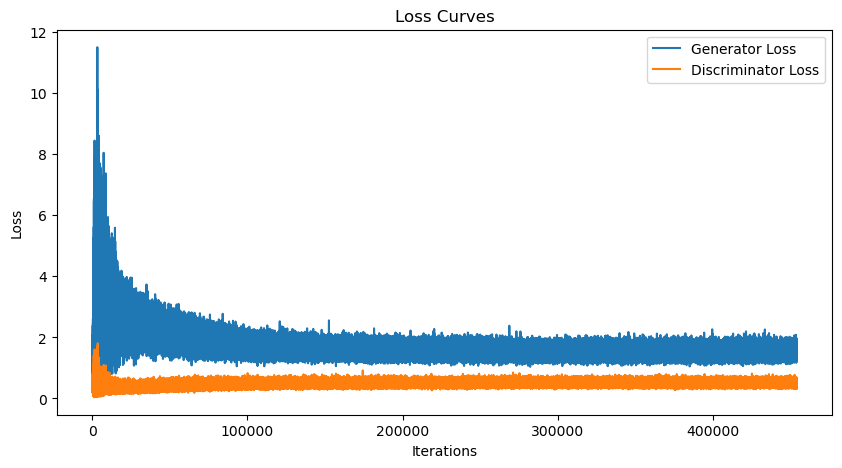

In [17]:
# Plotting loss curves function
def plot_loss_curves(g_losses, d_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(g_losses, label='Generator Loss')
    plt.plot(d_losses, label='Discriminator Loss')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss Curves')
    plt.show()

# Plot the loss curves
plot_loss_curves(g_losses, d_losses)

### Comparison of the Models

Compared to C-GAN model the C-VAE model performed well in creating images based on 
the input conditions, with stable further improvement, despite, sample images occasionally 
lacked fine details. However, C-Gan model loss value does not improve considerably stable, 
there was fluctuation with issues like overfitting, but still created sample images were very 
good with significant diversity.

### In conclusion

In the future both model needs experiment with different network architectures and different
latent space dimensions to improve image quality. In C-GAN needs regularization techniques 
and more complex architectures to stabilize training loss fluctuation and reduce mode 
collapse